# Setup

In [27]:
# Deep Learning for Time Series Classification
# Using CNNs, by Dustin Harris

# This project takes time series data, converts it to images, and
# uses image classification from the Fast AI library.

# Gesture Data Loading Code adapted from Makeability Lab: https://github.com/makeabilitylab

In [28]:
# Ensure that any edits to libraries you make are reloaded here automatically, 
# and also that any charts or images displayed are shown in this notebook.

%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [34]:
# Analysis
import matplotlib.pyplot as plt
import numpy as np 
import scipy as sp
from scipy import signal
import random
import os
import math
import itertools
import sys
from IPython.display import display_html
import pandas as pd
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import MinMaxScaler
plt.rcParams.update({'figure.max_open_warning': 0})

# Fast AI Libraries
from fastai.vision import *
from fastai.metrics import error_rate

# Gesture Libraries - created by Jon Froehlich for CSE 590 Ubicomp
import gesturerec.utility as grutils
import gesturerec.data as grdata
import gesturerec.vis as grvis

from gesturerec.data import SensorData
from gesturerec.data import GestureSet

# Time Series Libraries
from pyts.image import RecurrencePlot
from pyts.datasets import load_gunpoint
from pyts.image import MarkovTransitionField

# Load Data

In [35]:
# Load the data
root_gesture_log_path = './GestureLogs'

gesture_log_paths = grutils.get_immediate_subdirectories(root_gesture_log_path)
map_gesture_sets = dict()
selected_gesture_set = None

for gesture_log_path in gesture_log_paths:
    path_to_gesture_log = os.path.join(root_gesture_log_path, gesture_log_path)
    gesture_set = GestureSet(path_to_gesture_log)
    gesture_set.load()
    map_gesture_sets[gesture_set.name] = gesture_set

selected_gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "Dustin")
    
print("The selected gesture set:", selected_gesture_set)

Found 55 csv files in ./GestureLogs/NanGestures
Found 11 gestures
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Midair Zorro 'Z''
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Midair Clockwise 'O''
Found 5 trials for 'Custom'
Found 5 trials for 'Shake'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Midair 'S''
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair Counter-clockwise 'O''
Found 5 trials for 'At Rest'
Max trial length across all gesture is 'Custom' Trial 0 with 261 sensor events.
Avg samples/sec across 55 sensor files: 91.5
Avg sample length across 55 sensor files: 1.9s

Found 55 csv files in ./GestureLogs/NeilGestures
Found 11 gestures
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Midair Clockwise 'O''
Found 5 trials for 'Midair Zorro 'Z''
Found 5 trials for 'Shake'
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair 'S''
Found 5 trials for 'Underhand Bowling'
Found 5 tri

Found 5 trials for 'Midair Counter-clockwise 'O''
Found 5 trials for 'Midair Zorro 'Z''
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Midair 'S''
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair Clockwise 'O''
Found 5 trials for 'Shake'
Found 5 trials for 'Custom'
Found 5 trials for 'At Rest'
Max trial length across all gesture is 'Midair Counter-clockwise 'O'' Trial 4 with 367 sensor events.
Avg samples/sec across 55 sensor files: 91.3
Avg sample length across 55 sensor files: 2.5s

Found 55 csv files in ./GestureLogs/AlexisGestures
Found 11 gestures
Found 5 trials for 'Backhand Tennis'
Found 5 trials for 'Midair Zorro 'Z''
Found 5 trials for 'At Rest'
Found 5 trials for 'Shake'
Found 5 trials for 'Custom'
Found 5 trials for 'Baseball Throw'
Found 5 trials for 'Underhand Bowling'
Found 5 trials for 'Forehand Tennis'
Found 5 trials for 'Midair 'S''
Found 5 trials for 'Midair Counter-clo

In [36]:
# Iterate through data structure

print(f"We have {len(map_gesture_sets)} gesture sets:")
for gesture_set_name, gesture_set in map_gesture_sets.items():
    print(f" {gesture_set_name} with {len(gesture_set.get_all_trials())} trials")

# Feel free to change the selected_gesture_set. It's just a convenient variable
# to explore one gesture set at a time
print(f"The selected gesture set is: {selected_gesture_set.name}")

We have 26 gesture sets:
 NanGestures with 55 trials
 NeilGestures with 55 trials
 NooseGestures with 55 trials
 JustinGestures with 55 trials
 BryanGestures with 55 trials
 DustinGestures with 55 trials
 BrettGestures with 55 trials
 JuliaBGestures with 55 trials
 Paf2Gestures with 55 trials
 StacyGestures with 55 trials
 JasonGestures with 55 trials
 AGestures with 55 trials
 AnjaliGestures with 55 trials
 MattCGestures with 55 trials
 SamuelRGestures with 55 trials
 AlexisGestures with 55 trials
 NickGestures with 55 trials
 MikaelGestures with 55 trials
 WolfGestures with 55 trials
 AlexandraGestures with 55 trials
 ShaunGestures with 55 trials
 JonGestures with 55 trials
 EmmaGestures with 55 trials
 ThweidGestures with 55 trials
 JaeHGestures with 55 trials
 ClayGestures with 55 trials
The selected gesture set is: DustinGestures


# Preprocess Data

In [37]:
def preprocess_signal(s):
    '''Preprocesses the signal'''
    
    processed_signal = s
    mean_filter_window_size = 5 # Also tried 7, 10, but with lower accuracy
#     processed_signal = np.convolve(s, 
#                                    np.ones((mean_filter_window_size,))/mean_filter_window_size, 
#                                    mode='valid')
    
    # Downsampling
    processed_signal = signal.resample(processed_signal, 100)
    
    # -1<x<1
    processed_signal = 2.*(processed_signal - np.min(processed_signal))/np.ptp(processed_signal)-1
    # 0-1
#     processed_signal = 1*(processed_signal - np.min(processed_signal))/np.ptp(processed_signal).astype(int)

    # Detrending
#     processed_signal = signal.detrend(processed_signal, type == 'constant')
#     processed_signal = signal.detrend(processed_signal)
    
    # Additional filtering
    
    # FFT Filtering - commented out as this currently makes classification less accurate
    #processed_signal = signal.fftconvolve(s, s[::-1], mode='full')
    
    return processed_signal

def slice_signal(s):
    sliced_signal = s
    sliced_signal = sliced_signal[:45]
    return sliced_signal

def slice_trial(trial):
    '''Processess the given trial'''
    trial.accel.x_s = slice_signal((trial.accel.x))
    trial.accel.y_s = slice_signal((trial.accel.y))
    trial.accel.z_s = slice_signal((trial.accel.z))
    trial.accel.mag_s = slice_signal((trial.accel.mag))

def preprocess_trial(trial):
    '''Processess the given trial'''
    trial.accel.x_p = preprocess_signal(trial.accel.x)
    trial.accel.y_p = preprocess_signal(trial.accel.y)
    trial.accel.z_p = preprocess_signal(trial.accel.z)
    trial.accel.mag_p = preprocess_signal(trial.accel.mag)

for gesture_set in map_gesture_sets.values():
    for gesture_name, trials in gesture_set.map_gestures_to_trials.items():
        for trial in trials:
            preprocess_trial(trial)

NanGestures  processed.
NeilGestures  processed.
NooseGestures  processed.
JustinGestures  processed.
BryanGestures  processed.
DustinGestures  processed.
BrettGestures  processed.
JuliaBGestures  processed.
Paf2Gestures  processed.
StacyGestures  processed.
JasonGestures  processed.
AGestures  processed.
AnjaliGestures  processed.
MattCGestures  processed.
SamuelRGestures  processed.
AlexisGestures  processed.
NickGestures  processed.
MikaelGestures  processed.
WolfGestures  processed.
AlexandraGestures  processed.
ShaunGestures  processed.
JonGestures  processed.
EmmaGestures  processed.
ThweidGestures  processed.
JaeHGestures  processed.
ClayGestures  processed.


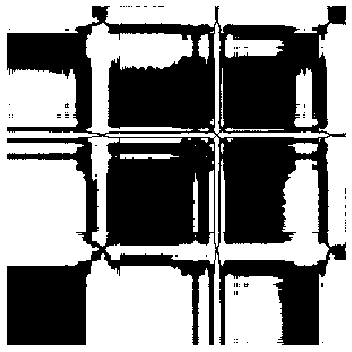

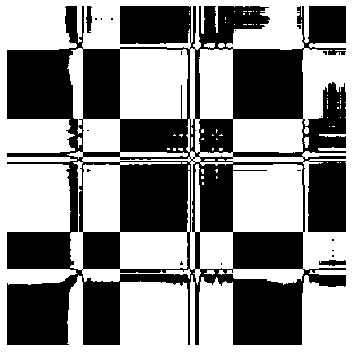

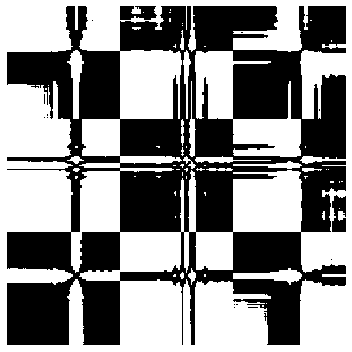

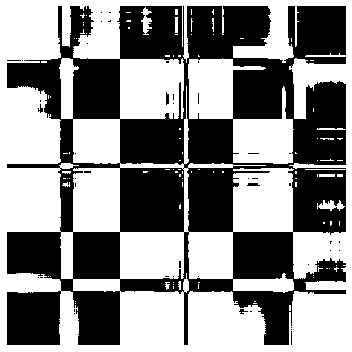

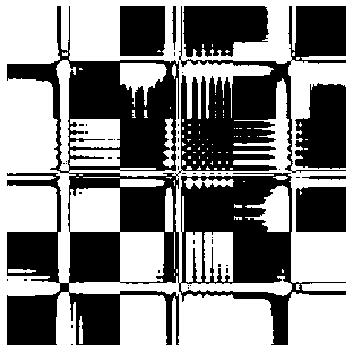

...

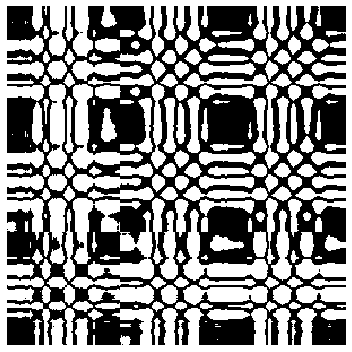

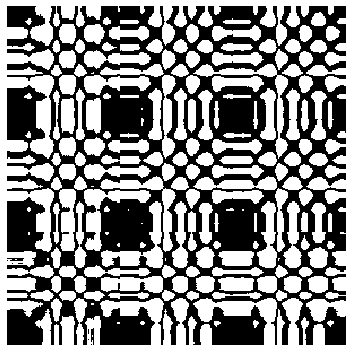

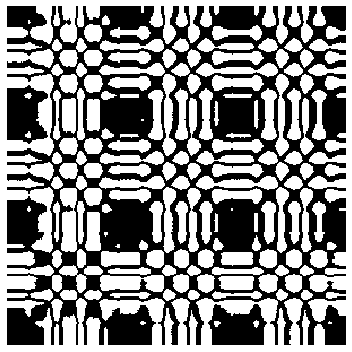

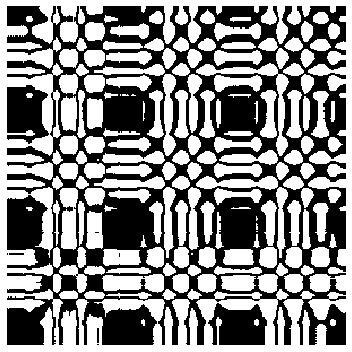

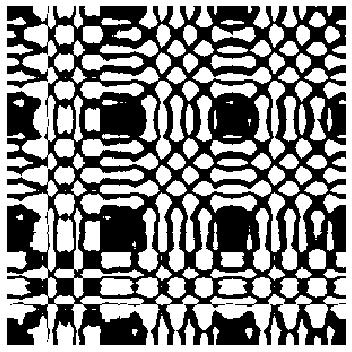

In [40]:
# Create Images

directory = './Processed-GestureImages/'

def create_all_rp_images():
    for gesture_set in map_gesture_sets.values():
        print(gesture_set.name, " processed.")
        for gesture_name, trials in gesture_set.map_gestures_to_trials.items():
            for trial in trials:
                final_stack = np.concatenate((trial.accel.x_p, trial.accel.y_p), axis=None)
                final_stack = np.concatenate((final_stack, trial.accel.z_p), axis=None)
                Images = [final_stack, final_stack]
                rp = RecurrencePlot(threshold='point', percentage=50)
                X_rp = rp.fit_transform(Images)

                plt.figure(figsize=(5, 5))
                plt.imshow(X_rp[0], cmap='binary', origin='lower')
                plt.axis('off')
                plt.tight_layout()
                path = directory + gesture_name + '/'
                filename = gesture_set.name + '_' + str(trial.trial_num) + '.png'
                path_n_file = path + filename
                if os.path.exists(path):
                    plt.savefig(path_n_file, bbox_inches='tight')
                else:
                    pass
                    
def create_random_trial_rp_images():
    selected_gesture_set = grdata.get_gesture_set_with_str(map_gesture_sets, "Dustin")

    for gesture_name in selected_gesture_set.get_gesture_names_sorted():
        print(gesture_name)
        trials = selected_gesture_set.map_gestures_to_trials[gesture_name]
        for trial in trials:
            Images = [trial.accel.mag_p, trial.accel.mag_p]
            rp = RecurrencePlot(threshold='point', percentage=50)
            X_rp = rp.fit_transform(Images)

            plt.figure(figsize=(5, 5))
            plt.imshow(X_rp[0], cmap='binary', origin='lower')
            plt.axis('off')
            plt.tight_layout()
            path = directory + gesture_name + '/'
            filename = selected_gesture_set.name + '_' + str(trial.trial_num) + '.png'
            print(path)
            path_n_file = path + filename
            if os.path.exists(path):
                plt.savefig(path_n_file, bbox_inches='tight')
            else:
                pass
            plt.show()

# Create all MTF Images

def create_all_mtf_images():
    directory = './MTFGestureImages/'

    for gesture_set in map_gesture_sets.values():
        for gesture_name, trials in gesture_set.map_gestures_to_trials.items():
            for trial in trials:
                mtf = MarkovTransitionField(image_size=24)
                Images = [trial.accel.mag, trial.accel.mag]
                X_mtf = mtf.fit_transform(Images)

                plt.figure(figsize=(5, 5))
                plt.imshow(X_mtf[0], cmap='rainbow', origin='lower')
                plt.axis('off')
                #plt.title('Markov Transition Field', fontsize=18)
                #plt.colorbar(fraction=0.0457, pad=0.04)
                plt.tight_layout()
                path = directory + gesture_name + '/' + gesture_set.name + '_' + str(trial.trial_num) + '.png'
                print(path)
                plt.savefig(path, bbox_inches='tight')
                plt.show()
                
# Create RP Images
create_all_rp_images()

DustinGestures: Baseball Throw
X:
Y:
Z:
MAG:
X+Y+Z:
[-112.  -96. -112. -112. ... -480. -160.  224.  416.]
[3280. 3328. 3328. 3360. ... 2896. 2816. 2576. 2288.]
[7424. 7424. 7488. 7536. ... 5120. 5280. 5520. 5984.]
[-112.  -96. -112. -112. ... 5120. 5280. 5520. 5984.]


<function matplotlib.pyplot.show(*args, **kw)>

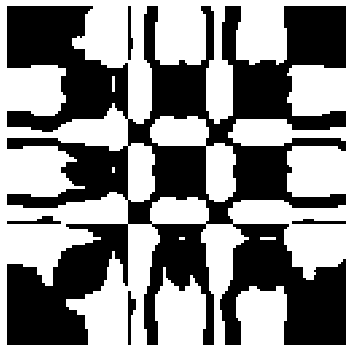

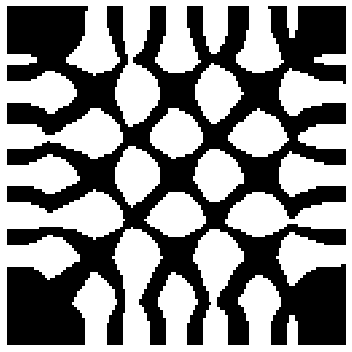

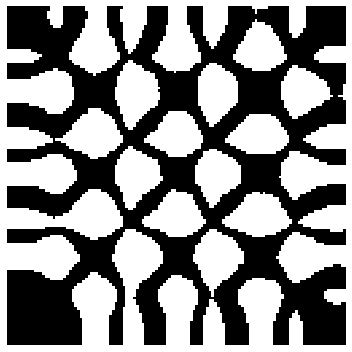

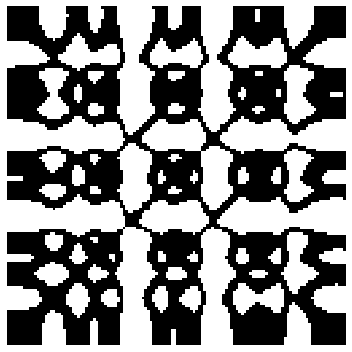

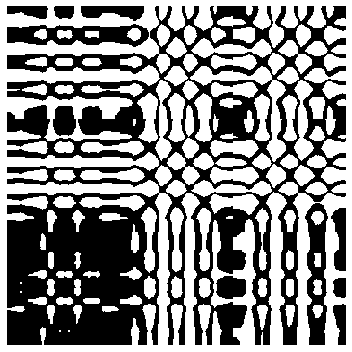

In [41]:
# Create single image

# Get random trial
rand_gesture_name = selected_gesture_set.get_random_gesture_name()

rand_trial = selected_gesture_set.get_random_trial_for_gesture(rand_gesture_name)

print(selected_gesture_set.name + ": " + rand_gesture_name)

print("X:")

final_stack = trial.accel.x + trial.accel.y + trial.accel.z
Images = [trial.accel.x, trial.accel.x]
rp = RecurrencePlot(threshold='point', percentage=50)
X_rp = rp.fit_transform(Images)

plt.figure(figsize=(5, 5))
plt.imshow(X_rp[0], cmap='binary', origin='lower')
plt.axis('off')
plt.tight_layout()
plt.show

print("Y:")

final_stack = trial.accel.x + trial.accel.y + trial.accel.z
Images = [trial.accel.y, trial.accel.y]
rp = RecurrencePlot(threshold='point', percentage=50)
X_rp = rp.fit_transform(Images)

plt.figure(figsize=(5, 5))
plt.imshow(X_rp[0], cmap='binary', origin='lower')
plt.axis('off')
plt.tight_layout()
plt.show

print("Z:")

final_stack = trial.accel.x + trial.accel.y + trial.accel.z
Images = [trial.accel.z, trial.accel.z]
rp = RecurrencePlot(threshold='point', percentage=50)
X_rp = rp.fit_transform(Images)

plt.figure(figsize=(5, 5))
plt.imshow(X_rp[0], cmap='binary', origin='lower')
plt.axis('off')
plt.tight_layout()
plt.show

print("MAG:")

Images = [trial.accel.mag, trial.accel.mag]
rp = RecurrencePlot(threshold='point', percentage=50)
X_rp = rp.fit_transform(Images)

plt.figure(figsize=(5, 5))
plt.imshow(X_rp[0], cmap='binary', origin='lower')
plt.axis('off')
plt.tight_layout()
plt.show

print("X+Y+Z:")

final_stack = np.concatenate((trial.accel.x, trial.accel.y), axis=None)
final_stack = np.concatenate((final_stack, trial.accel.z), axis=None)
print(trial.accel.x)
print(trial.accel.y)
print(trial.accel.z)
print(final_stack)
Images = [final_stack, final_stack]
rp = RecurrencePlot(threshold='point', percentage=50)
X_rp = rp.fit_transform(Images)

plt.figure(figsize=(5, 5))
plt.imshow(X_rp[0], cmap='binary', origin='lower')
plt.axis('off')
plt.tight_layout()
plt.show

# Transform Data

In [42]:
path = Path('/home/dustin/Documents/FinalProject/Processed-GestureImages/')

path.ls()

[PosixPath("/home/dustin/Documents/FinalProject/Processed-GestureImages/Midair Clockwise 'O'"),
 PosixPath('/home/dustin/Documents/FinalProject/Processed-GestureImages/At Rest'),
 PosixPath("/home/dustin/Documents/FinalProject/Processed-GestureImages/Midair Zorro 'Z'"),
 PosixPath('/home/dustin/Documents/FinalProject/Processed-GestureImages/Baseball Throw'),
 PosixPath('/home/dustin/Documents/FinalProject/Processed-GestureImages/Backhand Tennis'),
 PosixPath('/home/dustin/Documents/FinalProject/Processed-GestureImages/Forehand Tennis'),
 PosixPath("/home/dustin/Documents/FinalProject/Processed-GestureImages/Midair Counter-clockwise 'O'"),
 PosixPath("/home/dustin/Documents/FinalProject/Processed-GestureImages/Midair 'S'"),
 PosixPath('/home/dustin/Documents/FinalProject/Processed-GestureImages/Shake'),
 PosixPath('/home/dustin/Documents/FinalProject/Processed-GestureImages/Underhand Bowling')]

In [43]:
# Generate Fastai Vision Databunch

np.random.seed(41)
data = ImageDataBunch.from_folder(path, 
                                  train=".", 
                                  valid_pct=0.1,
                                  bs=16,
                                  num_workers=4).normalize(imagenet_stats)
data.classes

['At Rest',
 'Backhand Tennis',
 'Baseball Throw',
 'Forehand Tennis',
 "Midair 'S'",
 "Midair Clockwise 'O'",
 "Midair Counter-clockwise 'O'",
 "Midair Zorro 'Z'",
 'Shake',
 'Underhand Bowling']

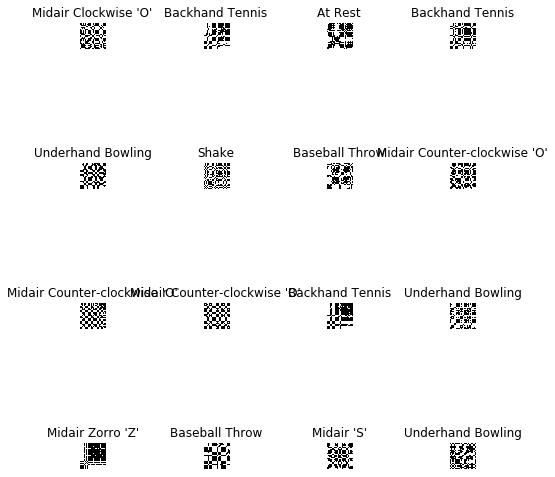

In [44]:
data.show_batch(rows=100, figsize=(7,8))

# Train Network

In [45]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

In [46]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.211661,1.487539,0.507692,00:15
1,1.476828,1.295681,0.438462,00:16
2,1.109139,1.249995,0.369231,00:15
3,0.792948,1.189813,0.400000,00:15


In [47]:
learn.save('stage-1')

In [48]:
learn.unfreeze()

In [49]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


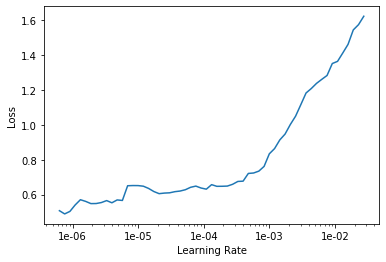

In [50]:
learn.recorder.plot()

In [51]:
learn.fit_one_cycle(4, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.703683,1.090876,0.361538,00:22
1,0.664257,0.874503,0.269231,00:22
2,0.408354,0.801049,0.253846,00:22
3,0.212802,0.700903,0.230769,00:22


In [52]:
learn.save('stage-2')

In [53]:
interp = ClassificationInterpretation.from_learner(learn)

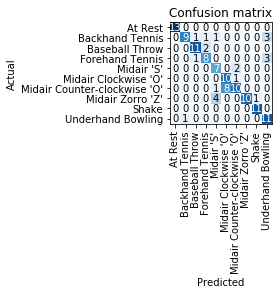

In [54]:
interp.plot_confusion_matrix()

# Export Results

In [55]:
learn.export()